In [ ]:
!pip install roboflow
!pip install "rfdetr[metrics]" tensorboard


from roboflow import Roboflow
rf = Roboflow(api_key="Ce4WN2N0FDuYAXhS7WJk")
project = rf.workspace("football-ai-c6sra").project("jr-nba-hsequ")
version = project.version(2)
dataset = version.download("coco")

DATASET_DIR = dataset.location       # path to the folder with train/valid/test




loading Roboflow workspace...
loading Roboflow project...


In [ ]:
print("Dataset dir:", DATASET_DIR)

Dataset dir: /content/Jr.-NBA-2


In [ ]:
!pip install roboflow rfdetr supervision

In [ ]:
from rfdetr import RFDETRMedium  # you already have this

model = RFDETRMedium()

model.train(
    dataset_dir=DATASET_DIR,
    epochs=20,
    batch_size=4,
    grad_accum_steps=4,
    lr=1e-4,
    output_dir="rf_detr_out",
    tensorboard=True,  # <--- enable TensorBoard logging
    # OR: wandb=True, project="rf_detr_project", run="rf_detr_run"
)


rf-detr-medium.pth: 100%|██████████| 386M/386M [00:18<00:00, 21.7MiB/s]


Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Loading pretrain weights
TensorBoard logging initialized. To monitor logs, use 'tensorboard --logdir rf_detr_out' and open http://localhost:6006/ in browser.
Not using distributed mode
git:
  sha: N/A, status: clean, branch: N/A

Namespace(num_classes=4, grad_accum_steps=4, amp=True, lr=0.0001, lr_encoder=0.00015, batch_size=4, weight_decay=0.0001, epochs=20, lr_drop=100, clip_max_norm=0.1, lr_vit_layer_decay=0.8, lr_component_decay=0.7, do_benchmark=False, dropout=0, drop_path=0.0, drop_mode='standard', drop_schedule='constant', cutoff_epoch=0, pretrained_encoder=None, pretrain_weights='rf-detr-medium.pth', pretrain_exclude_keys=None, pretrain_keys_modify_

Epoch: [0]  [0/5]  eta: 0:00:37  lr: 0.000100  class_error: 43.91  loss: 22.2706 (22.2706)  loss_ce: 0.2945 (0.2945)  loss_bbox: 1.6501 (1.6501)  loss_giou: 2.2057 (2.2057)  loss_ce_0: 0.2829 (0.2829)  loss_bbox_0: 1.9966 (1.9966)  loss_giou_0: 2.3756 (2.3756)  loss_ce_1: 0.2816 (0.2816)  loss_bbox_1: 1.7959 (1.7959)  loss_giou_1: 2.3156 (2.3156)  loss_ce_2: 0.2881 (0.2881)  loss_bbox_2: 1.6822 (1.6822)  loss_giou_2: 2.2417 (2.2417)  loss_ce_enc: 0.2710 (0.2710)  loss_bbox_enc: 2.0754 (2.0754)  loss_giou_enc: 2.5139 (2.5139)  loss_ce_unscaled: 0.2945 (0.2945)  class_error_unscaled: 43.9103 (43.9103)  loss_bbox_unscaled: 0.3300 (0.3300)  loss_giou_unscaled: 1.1029 (1.1029)  cardinality_error_unscaled: 3130.5000 (3130.5000)  loss_ce_0_unscaled: 0.2829 (0.2829)  loss_bbox_0_unscaled: 0.3993 (0.3993)  loss_giou_0_unscaled: 1.1878 (1.1878)  cardinality_error_0_unscaled: 2801.7500 (2801.7500)  loss_ce_1_unscaled: 0.2816 (0.2816)  loss_bbox_1_unscaled: 0.3592 (0.3592)  loss_giou_1_unscaled: 1

In [ ]:
%load_ext tensorboard
%tensorboard --logdir rf_detr_out


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 15001), started 0:00:08 ago. (Use '!kill 15001' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
import glob
import pandas as pd
import matplotlib.pyplot as plt
from tensorboard.backend.event_processing import event_accumulator

# 1. Find the TensorBoard event file written by RF-DETR
event_files = glob.glob("rf_detr_out/**/events.out.tfevents.*", recursive=True)
assert len(event_files) > 0, "No TensorBoard event files found in rf_detr_out"
event_path = event_files[0]  # if there are multiple, you can pick the latest

# 2. Load scalars from the event file
ea = event_accumulator.EventAccumulator(event_path)
ea.Reload()

print("Available scalar tags:", ea.Tags()['scalars'])


Available scalar tags: ['Loss/Train', 'Loss/Test', 'Metrics/Base/AP50_90', 'Metrics/Base/AP50', 'Metrics/Base/AR50_90', 'Metrics/EMA/AP50_90', 'Metrics/EMA/AP50', 'Metrics/EMA/AR50_90']


In [ ]:
from tensorboard.backend.event_processing import event_accumulator
import glob

event_files = glob.glob("rf_detr_out/**/events.out.tfevents.*", recursive=True)
assert len(event_files) > 0, "No TensorBoard event files found"
event_path = event_files[0]

ea = event_accumulator.EventAccumulator(event_path)
ea.Reload()

scalar_tags = ea.Tags()['scalars']
print("Available scalar tags:")
for t in scalar_tags:
    print("  ", t)


Available scalar tags:
   Loss/Train
   Loss/Test
   Metrics/Base/AP50_90
   Metrics/Base/AP50
   Metrics/Base/AR50_90
   Metrics/EMA/AP50_90
   Metrics/EMA/AP50
   Metrics/EMA/AR50_90


In [ ]:
from tensorboard.backend.event_processing import event_accumulator
import glob
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load the event file
event_files = glob.glob("rf_detr_out/**/events.out.tfevents.*", recursive=True)
assert len(event_files) > 0, "No TensorBoard event files found in rf_detr_out"
event_path = event_files[0]

ea = event_accumulator.EventAccumulator(event_path)
ea.Reload()

# 2. Grab the scalar series
loss_train      = ea.Scalars("Loss/Train")
loss_test       = ea.Scalars("Loss/Test")

base_ap50       = ea.Scalars("Metrics/Base/AP50")
base_ap50_90    = ea.Scalars("Metrics/Base/AP50_90")
base_ar50_90    = ea.Scalars("Metrics/Base/AR50_90")

ema_ap50        = ea.Scalars("Metrics/EMA/AP50")
ema_ap50_90     = ea.Scalars("Metrics/EMA/AP50_90")
ema_ar50_90     = ea.Scalars("Metrics/EMA/AR50_90")

# Use the steps from train loss as the x-axis (they’re "global steps")
steps = [e.step for e in loss_train]

# 3. Build a dict and align lengths safely
def to_values(events):
    return [e.value for e in events]

min_len = min(
    len(steps),
    len(loss_test),
    len(base_ap50),
    len(base_ap50_90),
    len(base_ar50_90),
    len(ema_ap50),
    len(ema_ap50_90),
    len(ema_ar50_90),
)

data = {
    "step":           steps[:min_len],
    "loss_train":     to_values(loss_train)[:min_len],
    "loss_test":      to_values(loss_test)[:min_len],
    "base_AP50":      to_values(base_ap50)[:min_len],
    "base_AP50_90":   to_values(base_ap50_90)[:min_len],
    "base_AR50_90":   to_values(base_ar50_90)[:min_len],
    "ema_AP50":       to_values(ema_ap50)[:min_len],
    "ema_AP50_90":    to_values(ema_ap50_90)[:min_len],
    "ema_AR50_90":    to_values(ema_ar50_90)[:min_len],
}

df = pd.DataFrame(data)

# Save as CSV table
df.to_csv("rf_detr_metrics.csv", index=False)
df.head()


,step,loss_train,loss_test,base_AP50,base_AP50_90,base_AR50_90,ema_AP50,ema_AP50_90,ema_AR50_90
0,0,13.047757,10.765986,0.066224,0.030585,0.153228,0.061014,0.027942,0.163581
1,1,9.290495,9.461743,0.368046,0.164917,0.268425,0.367702,0.169339,0.302868
2,2,8.387601,9.500452,0.418784,0.165448,0.258520,0.428478,0.173875,0.271736
3,3,7.901978,8.985679,0.486349,0.212423,0.296947,0.475175,0.206915,0.290067
4,4,7.307088,8.373919,0.610827,0.264421,0.348558,0.576083,0.250989,0.330063


<Figure size 640x480 with 0 Axes>

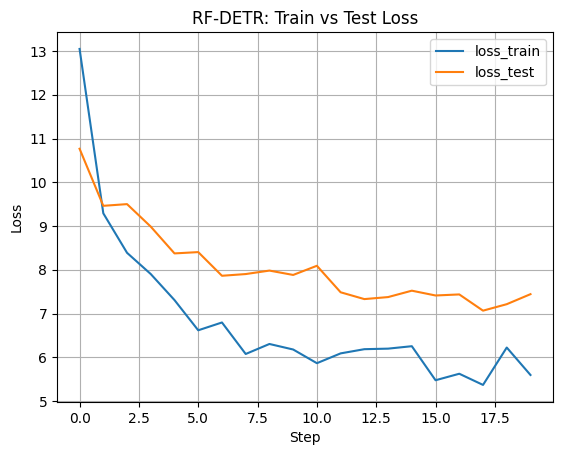

In [ ]:
plt.figure()
df.plot(x="step", y=["loss_train", "loss_test"])
plt.xlabel("Step")
plt.ylabel("Loss")
plt.title("RF-DETR: Train vs Test Loss")
plt.grid(True)
plt.show()


<Figure size 640x480 with 0 Axes>

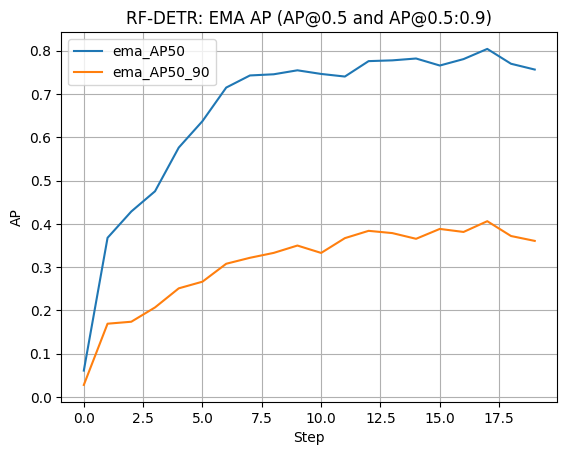

<Figure size 640x480 with 0 Axes>

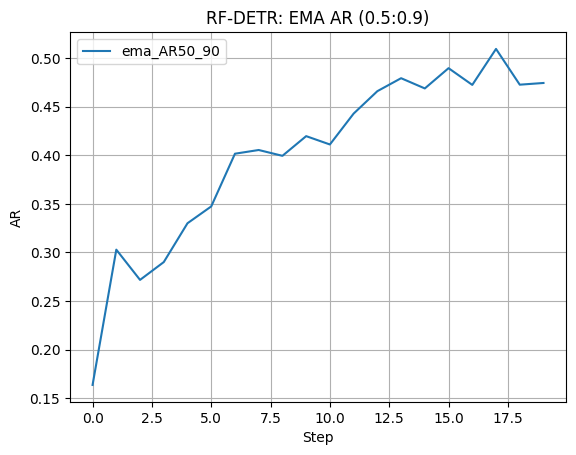

In [ ]:
# EMA AP curves
plt.figure()
df.plot(x="step", y=["ema_AP50", "ema_AP50_90"])
plt.xlabel("Step")
plt.ylabel("AP")
plt.title("RF-DETR: EMA AP (AP@0.5 and AP@0.5:0.9)")
plt.grid(True)
plt.show()

# EMA AR curve
plt.figure()
df.plot(x="step", y=["ema_AR50_90"])
plt.xlabel("Step")
plt.ylabel("AR")
plt.title("RF-DETR: EMA AR (0.5:0.9)")
plt.grid(True)
plt.show()


In [ ]:
from rfdetr import RFDETRMedium

model = RFDETRMedium()

history = []  # will store metrics dicts

def log_metrics(data):
    # This gets called at the end of each epoch
    print("Epoch metrics:", data)
    history.append(data)

# RF-DETR exposes internal callbacks dict:
model.callbacks["on_fit_epoch_end"].append(log_metrics)


Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Loading pretrain weights


In [ ]:
model.train(
    dataset_dir=DATASET_DIR,
    epochs=20,
    batch_size=4,
    grad_accum_steps=4,
    lr=1e-4,
    output_dir="rf_detr_out"
)


TensorBoard logging initialized. To monitor logs, use 'tensorboard --logdir rf_detr_out' and open http://localhost:6006/ in browser.
Not using distributed mode
git:
  sha: N/A, status: clean, branch: N/A

Namespace(num_classes=4, grad_accum_steps=4, amp=True, lr=0.0001, lr_encoder=0.00015, batch_size=4, weight_decay=0.0001, epochs=20, lr_drop=100, clip_max_norm=0.1, lr_vit_layer_decay=0.8, lr_component_decay=0.7, do_benchmark=False, dropout=0, drop_path=0.0, drop_mode='standard', drop_schedule='constant', cutoff_epoch=0, pretrained_encoder=None, pretrain_weights='rf-detr-medium.pth', pretrain_exclude_keys=None, pretrain_keys_modify_to_load=None, pretrained_distiller=None, encoder='dinov2_windowed_small', vit_encoder_num_layers=12, window_block_indexes=None, position_embedding='sine', out_feature_indexes=[3, 6, 9, 12], freeze_encoder=False, layer_norm=True, rms_norm=False, backbone_lora=False, force_no_pretrain=False, dec_layers=4, dim_feedforward=2048, hidden_dim=256, sa_nheads=8, ca_n

Epoch: [0]  [0/5]  eta: 0:00:15  lr: 0.000100  class_error: 43.91  loss: 22.2706 (22.2706)  loss_ce: 0.2945 (0.2945)  loss_bbox: 1.6501 (1.6501)  loss_giou: 2.2057 (2.2057)  loss_ce_0: 0.2829 (0.2829)  loss_bbox_0: 1.9966 (1.9966)  loss_giou_0: 2.3756 (2.3756)  loss_ce_1: 0.2816 (0.2816)  loss_bbox_1: 1.7959 (1.7959)  loss_giou_1: 2.3156 (2.3156)  loss_ce_2: 0.2881 (0.2881)  loss_bbox_2: 1.6822 (1.6822)  loss_giou_2: 2.2417 (2.2417)  loss_ce_enc: 0.2710 (0.2710)  loss_bbox_enc: 2.0754 (2.0754)  loss_giou_enc: 2.5139 (2.5139)  loss_ce_unscaled: 0.2945 (0.2945)  class_error_unscaled: 43.9103 (43.9103)  loss_bbox_unscaled: 0.3300 (0.3300)  loss_giou_unscaled: 1.1029 (1.1029)  cardinality_error_unscaled: 3130.5000 (3130.5000)  loss_ce_0_unscaled: 0.2829 (0.2829)  loss_bbox_0_unscaled: 0.3993 (0.3993)  loss_giou_0_unscaled: 1.1878 (1.1878)  cardinality_error_0_unscaled: 2801.7500 (2801.7500)  loss_ce_1_unscaled: 0.2816 (0.2816)  loss_bbox_1_unscaled: 0.3592 (0.3592)  loss_giou_1_unscaled: 1

In [ ]:
import pandas as pd

df = pd.DataFrame(history)
print(df.tail())          # last few epochs

print(df.columns)         # see available metric names
# e.g. 'epoch', 'train_loss', 'val_loss', 'val_map_50', 'val_map_50_95', ...


    train_lr  train_class_error  train_loss  train_loss_ce  train_loss_bbox  \
15  0.000100           0.649850    5.475789       0.552946         0.042775   
16  0.000100           0.292592    5.606410       0.562187         0.042061   
17  0.000100           0.461536    5.314468       0.536530         0.038143   
18  0.000100           0.076497    6.205547       0.601437         0.042165   
19  0.000082           1.410036    5.631639       0.565169         0.040761   

    train_loss_giou  train_loss_ce_0  train_loss_bbox_0  train_loss_giou_0  \
15         0.462576         0.610467           0.044835           0.477049   
16         0.483592         0.612462           0.043947           0.493921   
17         0.440714         0.606889           0.039780           0.455655   
18         0.558028         0.652982           0.044281           0.570718   
19         0.479309         0.632682           0.042505           0.492380   

    train_loss_ce_1  ...                            ema_

In [ ]:
import glob
import os

test_dir = os.path.join(DATASET_DIR, "test")

image_paths = sorted(
    glob.glob(os.path.join(test_dir, "*.jpg")) +
    glob.glob(os.path.join(test_dir, "*.jpeg")) +
    glob.glob(os.path.join(test_dir, "*.png"))
)

len(image_paths), image_paths[:5]


(2,
 ['/content/Jr.-NBA-2/test/IMG_20251115_205400_jpg.rf.373346243302477b33f5bb492e68cd13.jpg',
  '/content/Jr.-NBA-2/test/IMG_20251115_205415_jpg.rf.996d7a35a31ac1955c2e2fbcfc162079.jpg'])

In [ ]:
!pip install supervision pillow -q


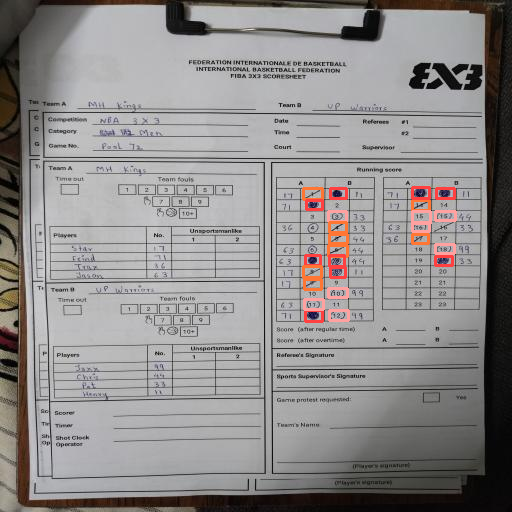

/content/Jr.-NBA-2/test/IMG_20251115_205400_jpg.rf.373346243302477b33f5bb492e68cd13.jpg


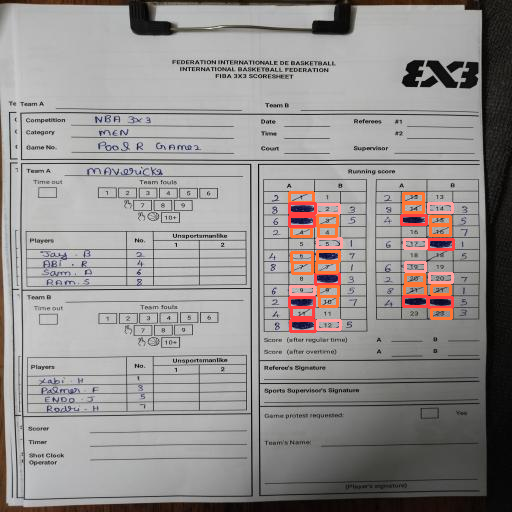

/content/Jr.-NBA-2/test/IMG_20251115_205415_jpg.rf.996d7a35a31ac1955c2e2fbcfc162079.jpg


In [ ]:
import supervision as sv
from PIL import Image
from IPython.display import display

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

# Just look at first N test images
N = 5

for path in image_paths[:N]:
    image = Image.open(path).convert("RGB")

    # RF-DETR returns a supervision.Detections or list of them
    detections = model.predict(image)

    # If it returns a list (e.g. batch), take first element
    if isinstance(detections, list):
        detections = detections[0]

    # Optional: turn class IDs into names if you know them
    # Suppose your Roboflow classes are in this order:
    # class_names = ["player", "ball", "referee", ...]
    #
    # labels = [
    #     f"{class_names[cls_id]} {confidence:0.2f}"
    #     for cls_id, confidence in zip(detections.class_id, detections.confidence)
    # ]
    # annotated = box_annotator.annotate(scene=image, detections=detections)
    # annotated = label_annotator.annotate(scene=annotated, detections=detections, labels=labels)

    annotated = box_annotator.annotate(scene=image, detections=detections)
    display(annotated)
    print(path)


In [ ]:
all_preds = []

for path in image_paths:
    image = Image.open(path).convert("RGB")
    det = model.predict(image)
    if isinstance(det, list):
        det = det[0]

    all_preds.append({
        "image_path": path,
        "xyxy": det.xyxy,              # bounding boxes
        "class_id": det.class_id,      # predicted classes
        "confidence": det.confidence,  # scores
    })

len(all_preds)


2

In [ ]:
import json, os
import numpy as np
from PIL import Image

test_dir = "/content/Jr.-NBA-2/test"
ann_path = os.path.join(test_dir, "_annotations.coco.json")

# ---- Load COCO annotations ----
with open(ann_path, "r") as f:
    coco = json.load(f)

# image_id -> file_name
id_to_filename = {img["id"]: img["file_name"] for img in coco["images"]}

# image_id -> list of (gt_box_xyxy, gt_class)
gt_by_img = {}
for ann in coco["annotations"]:
    img_id = ann["image_id"]
    x, y, w, h = ann["bbox"]  # COCO: [x, y, w, h]
    box_xyxy = [x, y, x + w, y + h]
    cls = ann["category_id"]
    gt_by_img.setdefault(img_id, []).append((box_xyxy, cls))

# ---- IoU helper ----
def iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_w = max(0, x2 - x1)
    inter_h = max(0, y2 - y1)
    inter = inter_w * inter_h

    area1 = max(0, box1[2] - box1[0]) * max(0, box1[3] - box1[1])
    area2 = max(0, box2[2] - box2[0]) * max(0, box2[3] - box2[1])
    union = area1 + area2 - inter + 1e-6
    return inter / union

# ---- Loop over test images and compute box accuracy ----
iou_thr = 0.5
conf_thr = 0.3

total_gt = 0
correct = 0

for img_id, gt_list in gt_by_img.items():
    fname = id_to_filename[img_id]
    img_path = os.path.join(test_dir, fname)

    image = Image.open(img_path).convert("RGB")

    # RF-DETR prediction
    preds = model.predict(image, threshold=conf_thr)
    if isinstance(preds, list):
        preds = preds[0]

    pred_boxes = preds.xyxy          # (N_pred, 4)
    pred_labels = preds.class_id     # (N_pred,)

    total_gt += len(gt_list)
    used_preds = set()

    for gt_box, gt_cls in gt_list:
        best_i = -1
        best_iou = 0.0

        for j, pb in enumerate(pred_boxes):
            if j in used_preds:
                continue
            this_iou = iou(gt_box, pb)
            if this_iou > best_iou:
                best_iou = this_iou
                best_i = j

        # match: IoU high enough AND same class
        if best_iou >= iou_thr and best_i != -1 and int(pred_labels[best_i]) == int(gt_cls):
            correct += 1
            used_preds.add(best_i)

accuracy = correct / total_gt if total_gt > 0 else 0.0
print(f"Box-level accuracy (IoU ≥ {iou_thr}, conf ≥ {conf_thr}): {accuracy:.4f}")
print(f"Matched GT boxes: {correct} / {total_gt}")


Box-level accuracy (IoU ≥ 0.5, conf ≥ 0.3): 0.8889
Matched GT boxes: 56 / 63


In [ ]:
from PIL import Image
import os

img_path = "/content/Jr.-NBA-2/train/IMG20251115202434_jpg.rf.7c02332e47a3206fd21fde64c6452534.jpg"
img = Image.open(img_path)
print(img.size)   # prints (width, height)


(512, 512)


In [ ]:
per_class_gt = {}
per_class_correct = {}

# inside the loop where we match GT boxes
# when you do `correct += 1`, also do:
per_class_gt[gt_cls] = per_class_gt.get(gt_cls, 0) + 1
if matched_correctly:
    per_class_correct[gt_cls] = per_class_correct.get(gt_cls, 0) + 1

# after the loop
for cls_id in per_class_gt:
    acc = per_class_correct.get(cls_id, 0) / per_class_gt[cls_id]
    print(cls_id, acc)


NameError: name 'matched_correctly' is not defined

In [ ]:
import json, os
import numpy as np
from PIL import Image

test_dir = "/content/Jr.-NBA-2/test"
ann_path = os.path.join(test_dir, "_annotations.coco.json")

# ---- Load COCO annotations ----
with open(ann_path, "r") as f:
    coco = json.load(f)

# image_id -> file_name
id_to_filename = {img["id"]: img["file_name"] for img in coco["images"]}

# image_id -> list of (gt_box_xyxy, gt_class)
gt_by_img = {}
for ann in coco["annotations"]:
    img_id = ann["image_id"]
    x, y, w, h = ann["bbox"]  # COCO: [x, y, w, h]
    box_xyxy = [x, y, x + w, y + h]
    cls = ann["category_id"]
    gt_by_img.setdefault(img_id, []).append((box_xyxy, cls))

# IoU helper
def iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])
    inter_w = max(0, x2 - x1)
    inter_h = max(0, y2 - y1)
    inter = inter_w * inter_h
    area1 = max(0, box1[2] - box1[0]) * max(0, box1[3] - box1[1])
    area2 = max(0, box2[2] - box2[0]) * max(0, box2[3] - box2[1])
    union = area1 + area2 - inter + 1e-6
    return inter / union

iou_thr = 0.5
conf_thr = 0.3

total_gt = 0
correct = 0
errors = []   # 👈 we store only incorrect GT boxes here

for img_id, gt_list in gt_by_img.items():
    fname = id_to_filename[img_id]
    img_path = os.path.join(test_dir, fname)

    image = Image.open(img_path).convert("RGB")

    preds = model.predict(image, threshold=conf_thr)
    if isinstance(preds, list):
        preds = preds[0]

    pred_boxes = preds.xyxy
    pred_labels = preds.class_id

    total_gt += len(gt_list)
    used_preds = set()

    for gt_box, gt_cls in gt_list:
        best_i = -1
        best_iou = 0.0

        for j, pb in enumerate(pred_boxes):
            if j in used_preds:
                continue
            this_iou = iou(gt_box, pb)
            if this_iou > best_iou:
                best_iou = this_iou
                best_i = j

        matched = False
        matched_pred_box = None
        matched_pred_cls = None

        if best_iou >= iou_thr and best_i != -1 and int(pred_labels[best_i]) == int(gt_cls):
            correct += 1
            used_preds.add(best_i)
            matched = True
            matched_pred_box = pred_boxes[best_i]
            matched_pred_cls = pred_labels[best_i]

        if not matched:
            # Save this incorrect GT box info
            errors.append({
                "img_path": img_path,
                "gt_box": gt_box,
                "gt_cls": int(gt_cls),
                "best_iou": float(best_iou),
                "pred_box": None if best_i == -1 else pred_boxes[best_i].tolist(),
                "pred_cls": None if best_i == -1 else int(pred_labels[best_i]),
            })

accuracy = correct / total_gt if total_gt > 0 else 0.0
print(f"Box-level accuracy (IoU ≥ {iou_thr}, conf ≥ {conf_thr}): {accuracy:.4f}")
print(f"Matched GT boxes: {correct} / {total_gt}")
print(f"Incorrect GT boxes stored: {len(errors)}")


Box-level accuracy (IoU ≥ 0.5, conf ≥ 0.3): 0.8889
Matched GT boxes: 56 / 63
Incorrect GT boxes stored: 7


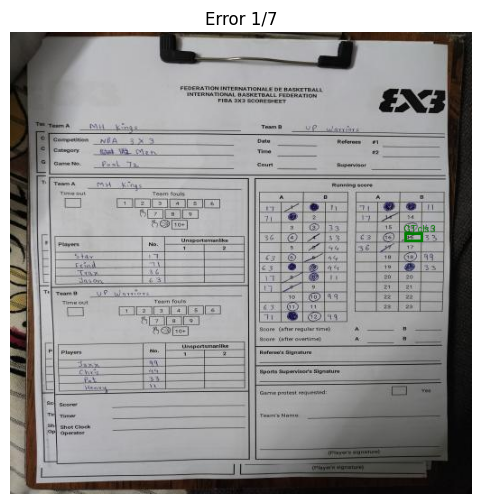

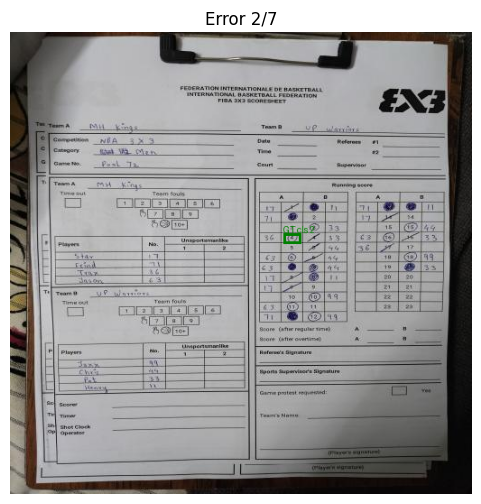

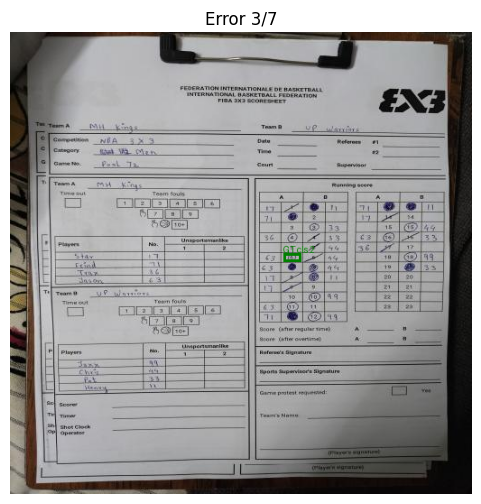

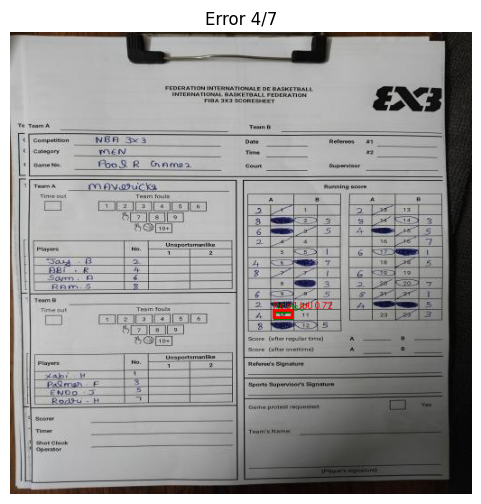

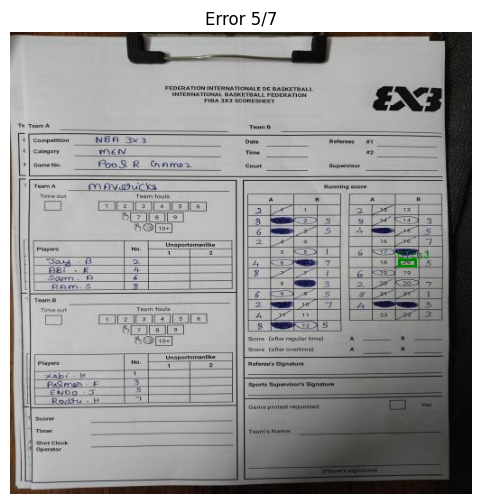

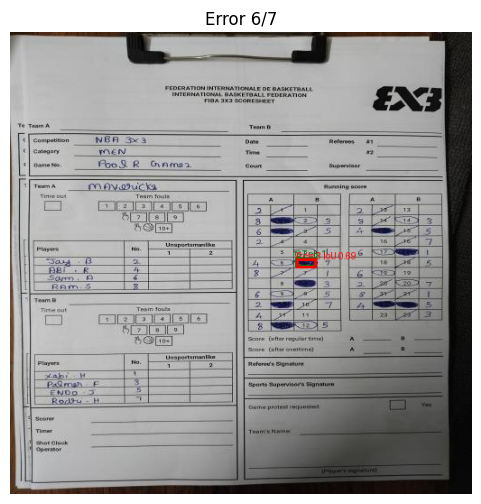

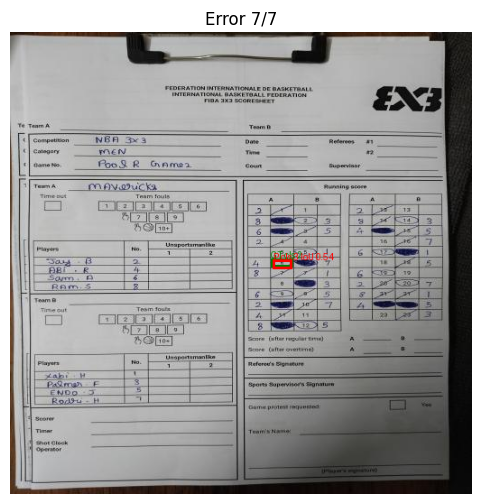

In [ ]:
from PIL import ImageDraw
import matplotlib.pyplot as plt

# how many errors you want to see (you have 7 total)
N = len(errors)  # or set to something smaller like 5

for idx, e in enumerate(errors[:N]):
    img = Image.open(e["img_path"]).convert("RGB")
    draw = ImageDraw.Draw(img)

    # GT box (green)
    x1, y1, x2, y2 = e["gt_box"]
    draw.rectangle([x1, y1, x2, y2], outline="green", width=3)
    draw.text((x1, y1 - 10), f"GT cls {e['gt_cls']}", fill="green")

    # Pred box (red), if there was any overlap candidate
    if e["pred_box"] is not None:
        px1, py1, px2, py2 = e["pred_box"]
        draw.rectangle([px1, py1, px2, py2], outline="red", width=3)
        draw.text((px1, py1 - 10), f"P cls {e['pred_cls']} IoU {e['best_iou']:.2f}", fill="red")
    else:
        # no predicted box anywhere near this GT
        pass

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Error {idx+1}/{N}")
    plt.show()


In [ ]:
import pandas as pd

# errors should already be defined from the accuracy loop
# each item in `errors` looks like:
# {
#   "img_path": ...,
#   "gt_box": [...],
#   "gt_cls": int,
#   "best_iou": float,
#   "pred_box": [... or None],
#   "pred_cls": int or None,
# }

df_errors = pd.DataFrame(errors)

# Optional: reorder columns for readability
df_errors = df_errors[[
    "img_path",
    "gt_cls",
    "pred_cls",
    "best_iou",
    "gt_box",
    "pred_box",
]]

# See all rows
df_errors


,img_path,gt_cls,pred_cls,best_iou,gt_box,pred_box
0,/content/Jr.-NBA-2/test/IMG_20251115_205400_jp...,3,NaN,0.000000,"[437, 222, 457, 232.5]",None
1,/content/Jr.-NBA-2/test/IMG_20251115_205400_jp...,2,NaN,0.000000,"[303, 223, 322, 234]",None
2,/content/Jr.-NBA-2/test/IMG_20251115_205400_jp...,2,NaN,0.000000,"[303, 245, 322.5, 254]",None
3,/content/Jr.-NBA-2/test/IMG_20251115_205415_jp...,3,1.0,0.722217,"[292, 309, 313.5, 318.5]","[291.087890625, 307.22625732421875, 313.612854..."
4,/content/Jr.-NBA-2/test/IMG_20251115_205415_jp...,3,NaN,0.000000,"[430, 251, 450, 260.5]",None
5,/content/Jr.-NBA-2/test/IMG_20251115_205415_jp...,1,3.0,0.687520,"[316, 250, 339.5, 260]","[317.22186279296875, 251.60914611816406, 339.1..."
6,/content/Jr.-NBA-2/test/IMG_20251115_205415_jp...,2,3.0,0.540635,"[289, 251, 313.5, 260]","[291.7034606933594, 252.89349365234375, 312.16..."


In [ ]:
!pip install easyocr pandas

import os
import numpy as np
import pandas as pd
from PIL import Image
import easyocr

from rfdetr import RFDETRMedium  # or RFDETRNano/Small/Large

# ---- 0.1 Load your trained RF-DETR model ----
BEST_CKPT = "rf_detr_out/checkpoint_best_total.pth"  # adjust if different
model = RFDETRMedium(pretrain_weights=BEST_CKPT)


# ---- 0.2 Choose a test image ----
# Either hardcode:
# IMAGE_PATH = "/content/Jr.-NBA-2/test/IMG_20251115_202539_jpg.rf.f44986991822a269e71bcfeff66935ad.jpg"

# Or just pick the first .jpg in the test folder:
TEST_DIR = "/content/Jr.-NBA-2/test"   # adjust if needed
IMAGE_PATH = [os.path.join(TEST_DIR, f)
              for f in os.listdir(TEST_DIR)
              if f.lower().endswith((".jpg", ".jpeg", ".png"))][0]

print("Using test image:", IMAGE_PATH)

image = Image.open(IMAGE_PATH).convert("RGB")
W, H = image.size

# ---- 0.3 Class mapping (adjust to your Roboflow classes order) ----
# Example:
CLASS_ID_TO_NAME = {
    1: "Filled Circle",
    2: "Hollow Circle",
    3: "Slash",
}

# ---- 0.4 OCR reader ----
reader = easyocr.Reader(['en'])


Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.


Loading pretrain weights
Using test image: /content/Jr.-NBA-2/test/IMG_20251115_205415_jpg.rf.996d7a35a31ac1955c2e2fbcfc162079.jpg
Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [ ]:
# Run detector
preds = model.predict(image, threshold=0.3)
if isinstance(preds, list):
    preds = preds[0]

symbols = []
for box, cls_id, conf in zip(preds.xyxy, preds.class_id, preds.confidence):
    x1, y1, x2, y2 = box
    cx = float((x1 + x2) / 2)
    cy = float((y1 + y2) / 2)
    symbols.append({
        "cx": cx,
        "cy": cy,
        "box": [float(x1), float(y1), float(x2), float(y2)],
        "class_id": int(cls_id),
        "class_name": CLASS_ID_TO_NAME[int(cls_id)],
        "conf": float(conf),
    })

print("Detected symbols:", len(symbols))


Detected symbols: 39


In [ ]:
import numpy as np

# Rough vertical band where the scoring rows live (tune if needed)
GRID_Y_MIN = 0.20 * H
GRID_Y_MAX = 0.95 * H

ocr_result = reader.readtext(np.array(image), detail=1)  # [ [box, text, conf], ... ]

jerseys = []
for box, text, conf in ocr_result:
    txt = text.strip().replace("O", "0")  # small cleanup
    if not txt.isdigit():
        continue
    if conf < 0.4:
        continue

    xs = [p[0] for p in box]
    ys = [p[1] for p in box]
    cx = float(sum(xs) / len(xs))
    cy = float(sum(ys) / len(ys))

    if not (GRID_Y_MIN <= cy <= GRID_Y_MAX):
        continue

    jerseys.append({
        "cx": cx,
        "cy": cy,
        "box": [float(xs[0]), float(ys[0]), float(xs[2]), float(ys[2])],
        "text": txt,
        "conf": float(conf),
    })

print("Detected jersey candidates:", len(jerseys))


Detected jersey candidates: 0


In [ ]:
import numpy as np

ocr_result = reader.readtext(np.array(image), detail=1)  # [ [box, text, conf], ... ]

print("Total OCR detections:", len(ocr_result))
for i, (box, text, conf) in enumerate(ocr_result):
    print(f"{i:02d} | conf={conf:.2f} | text={repr(text)} | box={box}")


Total OCR detections: 33
00 | conf=0.02 | text='crorbAD' | box=[[np.int32(172), np.int32(58)], [np.int32(216), np.int32(58)], [np.int32(216), np.int32(64)], [np.int32(172), np.int32(64)]]
01 | conf=0.00 | text='HeeneeEeeleleEnn' | box=[[np.int32(218), np.int32(60)], [np.int32(278), np.int32(60)], [np.int32(278), np.int32(64)], [np.int32(218), np.int32(64)]]
02 | conf=0.04 | text='@aakFT' | box=[[np.int32(290), np.int32(60)], [np.int32(322), np.int32(60)], [np.int32(322), np.int32(66)], [np.int32(290), np.int32(66)]]
03 | conf=0.02 | text='Ennmon' | box=[[np.int32(288), np.int32(66)], [np.int32(330), np.int32(66)], [np.int32(330), np.int32(72)], [np.int32(288), np.int32(72)]]
04 | conf=0.00 | text='Fin: 1r7rCope' | box=[[np.int32(214), np.int32(72)], [np.int32(284), np.int32(72)], [np.int32(284), np.int32(78)], [np.int32(214), np.int32(78)]]
05 | conf=0.85 | text='8' | box=[[np.int32(400), np.int32(55)], [np.int32(483), np.int32(55)], [np.int32(483), np.int32(93)], [np.int32(400), np.in

In [ ]:
def extract_digits(text: str) -> str:
    # keep only characters 0–9
    return "".join(ch for ch in text if ch.isdigit())


In [ ]:
jerseys = []

for box, text, conf in ocr_result:
    raw = text.strip().replace("O", "0")  # small cleanup
    digits = extract_digits(raw)

    # need at least 1 digit to consider it a jersey
    if digits == "":
        continue

    # optional: if your jersey numbers are always 1–2 digits:
    if len(digits) > 2:
        continue

    if conf < 0.3:   # slightly relaxed
        continue

    xs = [p[0] for p in box]
    ys = [p[1] for p in box]
    cx = float(sum(xs) / len(xs))
    cy = float(sum(ys) / len(ys))

    jerseys.append({
        "cx": cx,
        "cy": cy,
        "box": [float(xs[0]), float(ys[0]), float(xs[2]), float(ys[2])],
        "text": digits,       # store only the numeric jersey
        "raw_text": raw,      # for debugging
        "conf": float(conf),
    })

print("Detected jersey candidates:", len(jerseys))
pd.DataFrame(jerseys)[["text", "raw_text", "conf", "cx", "cy"]]


Detected jersey candidates: 3


,text,raw_text,conf,cx,cy
0,8,8,0.848943,441.5,74.0
1,3,NRA3,0.367902,123.0,120.0
2,7,7C,0.460103,196.0,193.0


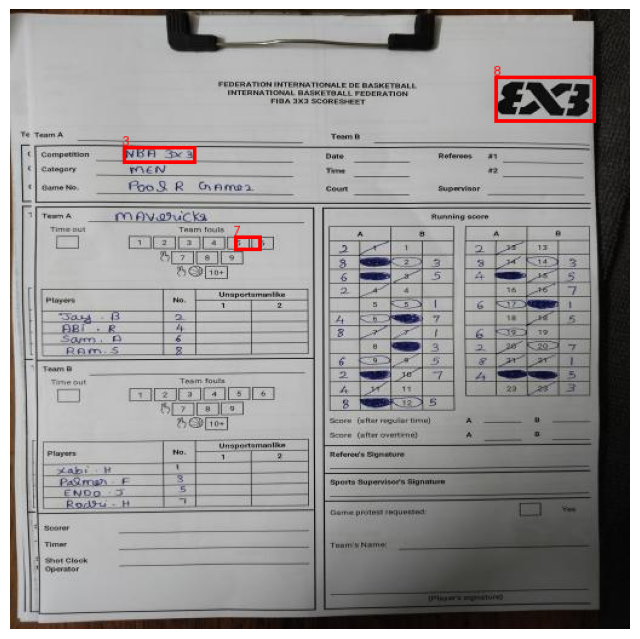

In [ ]:
from PIL import ImageDraw
import matplotlib.pyplot as plt

# Make a copy so we don't draw on the original
img_vis = image.copy()
draw = ImageDraw.Draw(img_vis)

for j in jerseys:
    x1, y1, x2, y2 = j["box"]
    jersey_text = j["text"]        # numeric jersey we extracted
    raw_text = j.get("raw_text", "")  # optional, for debugging

    # draw rectangle
    draw.rectangle([x1, y1, x2, y2], outline="red", width=3)

    # draw text slightly above the box
    label = f"{jersey_text}"  # or f"{jersey_text} ({raw_text})" to see OCR raw
    draw.text((x1, y1 - 10), label, fill="red")

plt.figure(figsize=(8, 10))
plt.imshow(img_vis)
plt.axis("off")
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from PIL import ImageDraw
import matplotlib.pyplot as plt

def extract_digits(text: str) -> str:
    # keep only 0–9
    return "".join(ch for ch in text if ch.isdigit())

# 1. Run OCR on entire page
ocr_result = reader.readtext(np.array(image), detail=1)  # [ [box, text, conf], ... ]

print("Total OCR detections:", len(ocr_result))
raw_rows = []
digit_candidates = []

for i, (box, text, conf) in enumerate(ocr_result):
    raw = text.strip().replace("O", "0")  # small cleanup: O -> 0
    digits = extract_digits(raw)

    raw_rows.append({
        "idx": i,
        "raw_text": raw,
        "digits": digits,
        "conf": float(conf),
        "box": box,
    })

    if digits != "":
        digit_candidates.append({
            "idx": i,
            "raw_text": raw,
            "digits": digits,
            "conf": float(conf),
            "box": box,
        })

print("\nDetections that contain at least one digit:", len(digit_candidates))

df_digits = pd.DataFrame(digit_candidates)
df_digits[["idx", "digits", "raw_text", "conf"]]


Total OCR detections: 33

Detections that contain at least one digit: 11


,idx,digits,raw_text,conf
0,4,17,Fin: 1r7rCope,0.004876
1,5,8,8,0.848943
2,7,3,NRA3,0.367902
3,8,0,T0CN,0.090869
4,15,7,7C,0.460103
5,17,0,a0W],0.246253
6,19,0,0olL,0.029341
7,26,0,0tn,0.021118
8,29,0,ENo0,0.092330
9,30,0,0at,0.120675


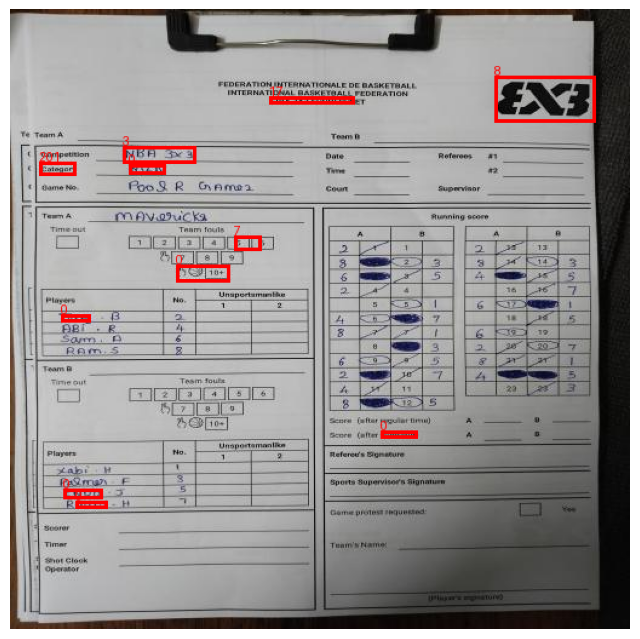

In [ ]:
# 2. Visualize all digit detections
img_vis = image.copy()
draw = ImageDraw.Draw(img_vis)

for d in digit_candidates:
    box = d["box"]   # list of 4 points: [[x1,y1], [x2,y2], [x3,y3], [x4,y4]]
    xs = [p[0] for p in box]
    ys = [p[1] for p in box]
    x1, y1 = min(xs), min(ys)
    x2, y2 = max(xs), max(ys)

    label = f'{d["digits"]}'  # just the cleaned number
    draw.rectangle([x1, y1, x2, y2], outline="red", width=3)
    draw.text((x1, y1 - 10), label, fill="red")

plt.figure(figsize=(8, 10))
plt.imshow(img_vis)
plt.axis("off")
plt.show()


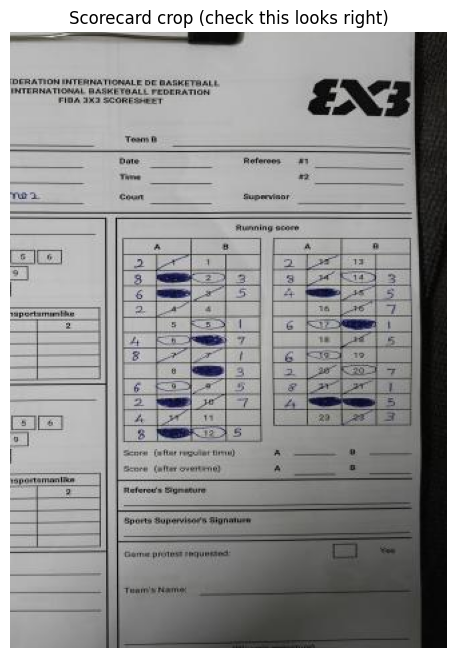

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

W, H = image.size

# Rough crop: right-hand scorecard area (tweak these numbers if needed)
# Start with a big region to be safe, then you can tighten it.
grid_x1 = int(0.35 * W)
grid_y1 = int(0.05 * H)
grid_x2 = int(0.99 * W)
grid_y2 = int(0.95 * H)

grid_box = (grid_x1, grid_y1, grid_x2, grid_y2)
grid_img = image.crop(grid_box)

plt.figure(figsize=(6, 8))
plt.imshow(grid_img)
plt.axis("off")
plt.title("Scorecard crop (check this looks right)")
plt.show()


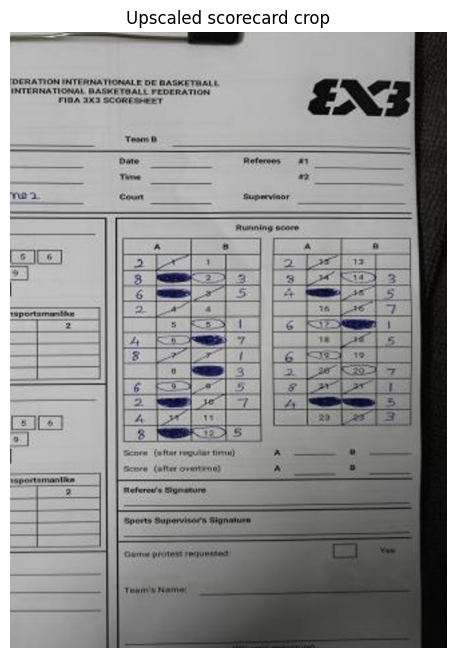

Grid OCR detections: 23
Digit candidates in scorecard area: 22


,idx,digits,raw_text,conf
0,0,0085050456643,0085050456643,0.017340
1,1,103040480,103040480,0.015203
2,2,5107741,5107741,0.124061
3,3,3152,3152,0.044356
4,4,8,8,0.998597
5,5,7,7,0.156624
6,6,0,0,0.267945
7,7,80,80,0.181643
8,8,1,1,0.510161
9,9,0,0,0.218914


In [ ]:
import numpy as np

# Upscale the grid crop so digits are larger (2x)
scale = 2
grid_big = grid_img.resize(
    (grid_img.width * scale, grid_img.height * scale),
    resample=Image.BICUBIC
)

plt.figure(figsize=(6, 8))
plt.imshow(grid_big)
plt.axis("off")
plt.title("Upscaled scorecard crop")
plt.show()

def extract_digits(text: str) -> str:
    return "".join(ch for ch in text if ch.isdigit())

# Run OCR focusing on digits
ocr_grid = reader.readtext(
    np.array(grid_big),
    detail=1,
    allowlist="0123456789"   # only digits
)

print("Grid OCR detections:", len(ocr_grid))

digit_candidates_grid = []

for i, (box, text, conf) in enumerate(ocr_grid):
    raw = text.strip().replace("O", "0")
    digits = extract_digits(raw)
    if digits == "":
        continue

    xs = [p[0] for p in box]
    ys = [p[1] for p in box]
    x1, y1 = min(xs), min(ys)
    x2, y2 = max(xs), max(ys)

    # center in the upscaled crop
    cx_big = (x1 + x2) / 2
    cy_big = (y1 + y2) / 2

    # map back to original full-image coordinates
    cx_full = grid_x1 + cx_big / scale
    cy_full = grid_y1 + cy_big / scale

    digit_candidates_grid.append({
        "idx": i,
        "digits": digits,
        "raw_text": raw,
        "conf": float(conf),
        "cx_full": cx_full,
        "cy_full": cy_full,
        "x1_full": grid_x1 + x1 / scale,
        "y1_full": grid_y1 + y1 / scale,
        "x2_full": grid_x1 + x2 / scale,
        "y2_full": grid_y1 + y2 / scale,
    })

print("Digit candidates in scorecard area:", len(digit_candidates_grid))
pd.DataFrame(digit_candidates_grid)[["idx", "digits", "raw_text", "conf"]]


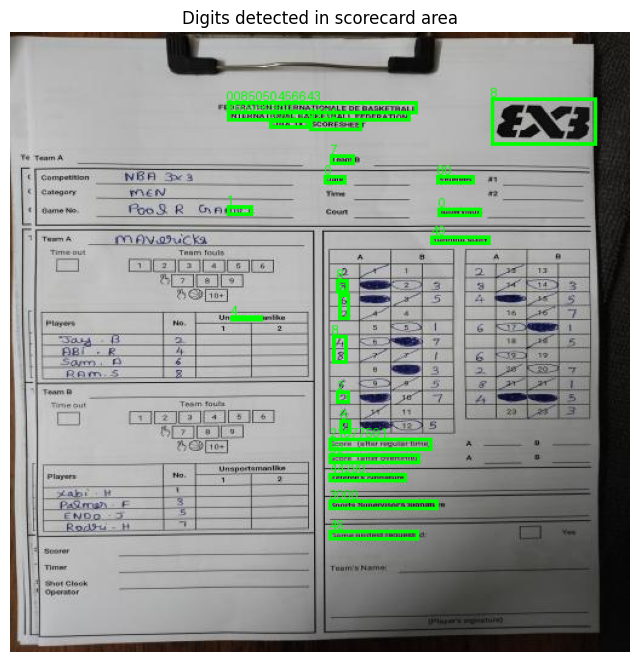

In [ ]:
from PIL import ImageDraw

img_vis = image.copy()
draw = ImageDraw.Draw(img_vis)

for d in digit_candidates_grid:
    x1, y1, x2, y2 = d["x1_full"], d["y1_full"], d["x2_full"], d["y2_full"]
    label = d["digits"]

    draw.rectangle([x1, y1, x2, y2], outline="lime", width=3)
    draw.text((x1, y1 - 10), label, fill="lime")

plt.figure(figsize=(8, 10))
plt.imshow(img_vis)
plt.axis("off")
plt.title("Digits detected in scorecard area")
plt.show()


Image size: 1536 x 2048


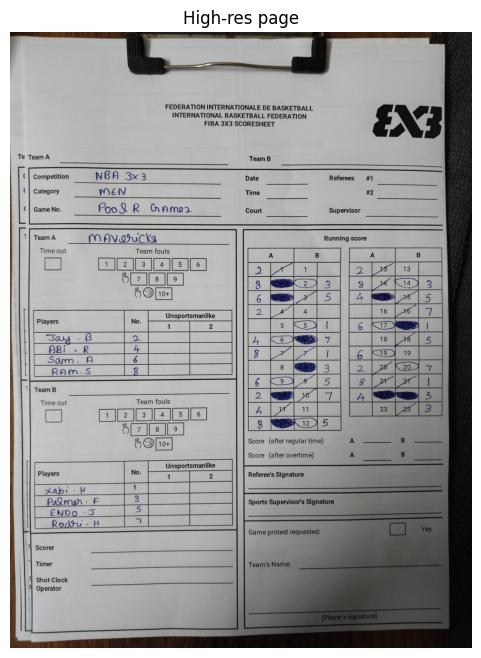

In [ ]:
!pip install easyocr pandas

import numpy as np
import pandas as pd
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import easyocr

# ---- 1. Load your new high-res image ----
IMAGE_PATH = "/content/Jr.-NBA-3/test/IMG_20251115_205415_jpg.rf.d9224e8fcc32c75726f51ad8f48ecaa6.jpg"  # <- change this to your new image
image = Image.open(IMAGE_PATH).convert("RGB")
W, H = image.size
print("Image size:", W, "x", H)

plt.figure(figsize=(6, 8))
plt.imshow(image)
plt.axis("off")
plt.title("High-res page")
plt.show()

# ---- 2. Create OCR reader ----
reader = easyocr.Reader(['en'])


In [ ]:
def extract_digits(text: str) -> str:
    return "".join(ch for ch in text if ch.isdigit())

# Run OCR on full page
ocr_result = reader.readtext(np.array(image), detail=1)  # [ [box, text, conf], ... ]
print("Total OCR detections:", len(ocr_result))

digit_candidates = []

for i, (box, text, conf) in enumerate(ocr_result):
    raw = text.strip().replace("O", "0")  # small cleanup
    digits = extract_digits(raw)

    if digits == "":
        continue  # skip anything with no digits at all

    xs = [p[0] for p in box]
    ys = [p[1] for p in box]
    x1, y1 = min(xs), min(ys)
    x2, y2 = max(xs), max(ys)
    cx = (x1 + x2) / 2
    cy = (y1 + y2) / 2

    digit_candidates.append({
        "idx": i,
        "digits": digits,
        "raw_text": raw,
        "conf": float(conf),
        "x1": x1,
        "y1": y1,
        "x2": x2,
        "y2": y2,
        "cx": cx,
        "cy": cy,
    })

print("Detections that contain at least one digit:", len(digit_candidates))

df_digits = pd.DataFrame(digit_candidates)
df_digits[["idx", "digits", "raw_text", "conf"]]


Total OCR detections: 119
Detections that contain at least one digit: 69


,idx,digits,raw_text,conf
0,0,00,FEDERATI0N INTERNATI0NALE DE BASKETBALL,0.965537
1,1,00,INTERNATI0NAL BASKETBALL FEDERATI0N,0.951334
2,2,330,FIBA 3X3 SC0RESHEET,0.677584
3,3,1,{1,0.297737
4,8,33,3x 3,0.809423
...,...,...,...,...
64,95,10,10+,0.999122
65,105,3,3,0.997609
66,108,5,5,0.999936
67,109,7,7,0.999995


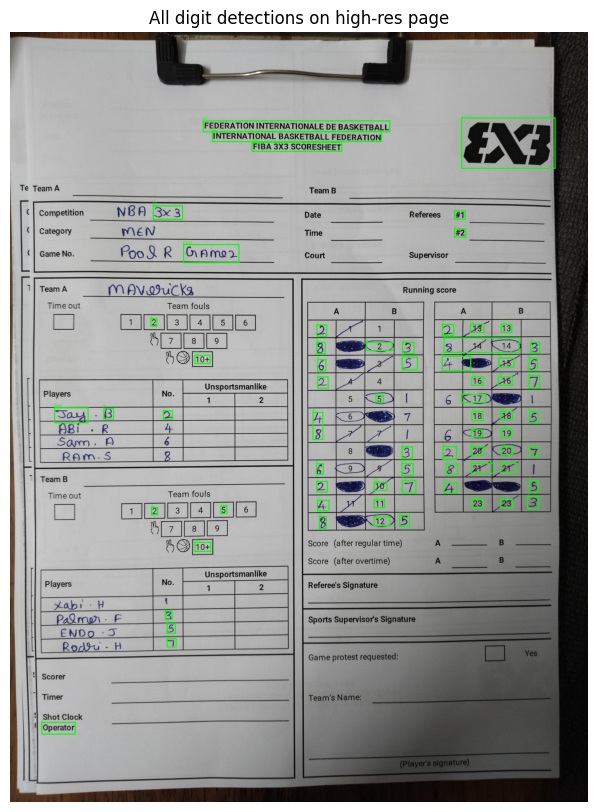

In [ ]:
img_vis = image.copy()
draw = ImageDraw.Draw(img_vis)

for d in digit_candidates:
    x1, y1, x2, y2 = d["x1"], d["y1"], d["x2"], d["y2"]
    label = d["digits"]  # cleaned numeric text

    draw.rectangle([x1, y1, x2, y2], outline="lime", width=3)
    draw.text((x1, y1 - 10), label, fill="lime")

plt.figure(figsize=(8, 10))
plt.imshow(img_vis)
plt.axis("off")
plt.title("All digit detections on high-res page")
plt.show()


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Ce4WN2N0FDuYAXhS7WJk")
project = rf.workspace("football-ai-c6sra").project("jr-nba-hsequ")
version = project.version(3)
dataset = version.download("coco")
